In [1]:
import pandas as pd
import numpy as np
import os
import openpyxl
import matplotlib.pyplot as plt
from time import sleep
from datetime import datetime
import folium
import geopandas as gd
from folium.plugins import Draw, Fullscreen, Geocoder, MeasureControl

In [2]:
#Path projetos
path_projetos = r"\\glwfs02.lwart.net\LWC-FLORESTAL\Qualidade_Florestal\03- ADMINISTRATIVO\2023\06- COLABORADORES\Gabriel\23 - Mapas\Projetos\USO_FAZENDA.shp"

In [3]:
#Lendo o arquivo de fazendas
projetos = gd.read_file(path_projetos, drive = 'GeoJSON')

#Definindo  crs para 31983 UTM zone 23s
projetos = projetos.to_crs(epsg=31983)

#Setando qual geometria deve ser utilizada
projetos = projetos[['ID_PROJETO','geometry']].set_geometry('geometry')



In [4]:
#Base de otimização de rotas
otimizacao_rotas = pd.read_excel("Otimização de rotas.xlsx",sheet_name='Trajeto Geral (Equ x Base Faz)', skiprows=6).drop(['Unnamed: 0','Unnamed: 1'],axis=1)

In [5]:
#Capacidade por equipe
capacidade_equipe = pd.read_excel("cadastro equipes e demandas.xlsx", sheet_name='Capacidade por equipe')

In [6]:
#Base de demandas
demanda = pd.read_excel('cadastro equipes e demandas.xlsx', sheet_name='Demanda por fazenda', dtype={'ID Fazenda': 'object', 'Mês de Demanda': 'datetime64[ns]'})

In [7]:
#Função de máscara

def mascara(df, coluna,n_digitos):
    df[coluna] = df[coluna].astype(str)
    df[coluna] = str("000") + df[coluna]
    df[coluna] = df[coluna].astype(str).str[-n_digitos:] 
    return df

In [8]:
#demanda 
#Ajustando o id da coluna Fazenda
demanda = mascara(demanda,'ID Fazenda', 4)



In [9]:
#Data frame de equipes e siglas
#Criando um data frame com listcomprehension

equipes = [ i for  i in otimizacao_rotas['COD'].str[7:].unique()]
equipes_s = [ i for  i in otimizacao_rotas['Equipe'].unique()]


equipes_base = pd.DataFrame(
    { 'Equipe': equipes,
     'Equipe sigla' : equipes_s
    }
)



In [10]:
equipes_base

,Equipe,Equipe sigla
0,Lençóis Paulista,A
1,Duartina,B
2,Garça,C
3,Pirajuí,D
4,Bauru,E
5,Getulina,G
6,Cabrália Paulista,H


In [11]:
#Capacidade da equipe 
#Ajustando a capacidade da equipe


capacidade_equipe['Gordura'] = 0.05

capacidade_equipe['Capacidade ajustada'] = (capacidade_equipe['Gordura'] * capacidade_equipe['Capacidade']) + capacidade_equipe['Capacidade']

capacidade_equipe = capacidade_equipe.merge(equipes_base, on='Equipe', how='left')


In [12]:
capacidade_equipe

,Equipe,Capacidade,Distancia,Mês Operacional,Gordura,Capacidade ajustada,Equipe sigla
0,Lençóis Paulista,100000,100000,2024-04-01,0.05,105000.0,A
1,Duartina,100000,100000,2024-04-01,0.05,105000.0,B
2,Garça,100000,100000,2024-04-01,0.05,105000.0,C
3,Pirajuí,100000,100000,2024-04-01,0.05,105000.0,D
4,Bauru,100000,100000,2024-04-01,0.05,105000.0,E
5,Getulina,100000,100000,2024-04-01,0.05,105000.0,G
6,Cabrália Paulista,100000,100000,2024-04-01,0.05,105000.0,H
7,Lençóis Paulista,100000,100000,2024-03-01,0.05,105000.0,A
8,Duartina,100000,100000,2024-03-01,0.05,105000.0,B
9,Garça,100000,100000,2024-03-01,0.05,105000.0,C


In [13]:
#Otimização de rotas
#Ajustando a coluna id fazenda
otimizacao_rotas = mascara(otimizacao_rotas,'ID Fazenda',4)


In [14]:
#Construindo otimização de rotas

#trazendo base de demandas
otimizacao_rotas = otimizacao_rotas.merge(demanda[['ID Fazenda','Área Avaliada', 'Mês avaliação']], left_on='ID Fazenda', right_on='ID Fazenda', how='left')

#Ordenando a base
otimizacao_rotas = otimizacao_rotas.sort_values(['Mês avaliação','ID Fazenda','Trajeto (Km)'],ascending=[True,True,True])

#Capacidade por equipe
otimizacao_rotas = otimizacao_rotas.merge(capacidade_equipe[['Mês Operacional', 'Capacidade', 'Capacidade ajustada', 'Equipe sigla']],left_on=['Equipe','Mês avaliação'], right_on=['Equipe sigla','Mês Operacional'], how='left')

otimizacao_rotas= otimizacao_rotas.rename({
    'Mês Operacional':'Mês operacional equipe',
    'Mês avaliação': 'Mês demanda'
}, axis=1)


otimizacao_rotas = otimizacao_rotas.drop(['Equipe sigla','Cidade origem'],axis=1)


otimizacao_rotas = otimizacao_rotas[pd.notna(otimizacao_rotas['Mês operacional equipe'])]


In [15]:
#Resetando o índice para utilizá-lo no i.loc
#Encontrando quais são as ordem de distância das fazendas

otimizacao_rotas.reset_index(drop=True, inplace=True)

otimizacao_rotas['Equipe mais próxima'] = 0
ordem = 0

for i in range(1, len(otimizacao_rotas)):
    if otimizacao_rotas.loc[i, 'ID Fazenda'] == otimizacao_rotas.loc[i-1, 'ID Fazenda']:
        ordem += 1
    else:
        ordem = 0
    otimizacao_rotas.loc[i, 'Equipe mais próxima'] = ordem

In [16]:
otimizacao_rotas

,Equipe,ID Fazenda,Projeto,Área,COD,Trajeto (Km),Área Avaliada,Mês demanda,Mês operacional equipe,Capacidade,Capacidade ajustada,Equipe mais próxima
0,H,0003,UNIÃO,913.96,0003 - Cabrália Paulista,18.858908,748.94,2024-03-01,2024-03-01,100000.0,105000.0,0
1,B,0003,UNIÃO,913.96,0003 - Duartina,29.064904,748.94,2024-03-01,2024-03-01,100000.0,105000.0,1
2,E,0003,UNIÃO,913.96,0003 - Bauru,40.215705,748.94,2024-03-01,2024-03-01,100000.0,105000.0,2
3,A,0003,UNIÃO,913.96,0003 - Lençóis Paulista,64.514186,748.94,2024-03-01,2024-03-01,100000.0,105000.0,3
4,C,0003,UNIÃO,913.96,0003 - Garça,73.350765,748.94,2024-03-01,2024-03-01,100000.0,105000.0,4
...,...,...,...,...,...,...,...,...,...,...,...,...
5602,B,2411,PINDORAMA II - GLEBA C,860.08,2411 - Duartina,81.725020,18.66,2024-04-01,2024-04-01,100000.0,105000.0,2
5603,A,2411,PINDORAMA II - GLEBA C,860.08,2411 - Lençóis Paulista,82.414277,18.66,2024-04-01,2024-04-01,100000.0,105000.0,3
5604,H,2411,PINDORAMA II - GLEBA C,860.08,2411 - Cabrália Paulista,85.177795,18.66,2024-04-01,2024-04-01,100000.0,105000.0,4
5605,C,2411,PINDORAMA II - GLEBA C,860.08,2411 - Garça,97.382755,18.66,2024-04-01,2024-04-01,100000.0,105000.0,5


In [17]:
#Criar uma lógica para criar um dicionário que vai aumentando a demanda conforme é atribuído fazendas para ela de acordo com a coluna equipe mais próxima

#A fazenda deve sempre ser atribuída no momento que ela for mais próxima da equipe, a capacidade só pode ser olhada quando a equipe mais próxima for maior que zero

#Tabelinha de demanda da equipe com a demanda mês atual dela


In [18]:
#Analisar capacidade

demanda_total_mes = demanda.groupby(['Mês avaliação'])['Área Avaliada'].sum().reset_index()

capacidade_total_mes = capacidade_equipe.groupby(['Mês Operacional'])['Capacidade ajustada'].sum().reset_index()

analise_capacidade = demanda_total_mes.merge(capacidade_total_mes, left_on='Mês avaliação', right_on='Mês Operacional', how='left')

analise_capacidade['delta capacidade'] = analise_capacidade['Capacidade ajustada'] - analise_capacidade['Área Avaliada']   

analise_capacidade['status capacidade'] = np.where(analise_capacidade['delta capacidade'] > 0 , 'temos Capacidade para a demanda', 'não temos capacidade para a demanda')

analise_capacidade['Mês avaliação'] = analise_capacidade['Mês avaliação'].dt.strftime('%m-%y')

for k,v in analise_capacidade.iterrows():
    print(f"No mês {v['Mês avaliação']} {v['status capacidade']}")


analise_capacidade


No mês 03-24 temos Capacidade para a demanda
No mês 04-24 temos Capacidade para a demanda


,Mês avaliação,Área Avaliada,Mês Operacional,Capacidade ajustada,delta capacidade,status capacidade
0,03-24,85794.63,2024-03-01,735000.0,649205.37,temos Capacidade para a demanda
1,04-24,71352.96,2024-04-01,735000.0,663647.04,temos Capacidade para a demanda


In [19]:
#Plano A, Plano B e Plano C

#Sempre vai me trazer qual é a equipe mais próxima

def definir_equipe(row,proximidade):
    if (row['Equipe mais próxima'] == proximidade ) & (row['Mês demanda'] == row['Mês operacional equipe']):
        return row['Equipe']
    else:
        return np.nan

otimizacao_rotas['Plano A'] = otimizacao_rotas.apply(definir_equipe,axis=1,args=(0,))

otimizacao_rotas['Plano B'] = otimizacao_rotas.apply(definir_equipe,axis=1,args=(1,))

otimizacao_rotas['Plano C'] = otimizacao_rotas.apply(definir_equipe,axis=1,args=(2,))


In [20]:
carteira_equipe = {}

def adiciona_equipe(informacoes_equipe, dicionario, demanda_inicial, km_inicial):
    for _, v in informacoes_equipe.iterrows():
        dicionario[v['Equipe sigla'] + v['Mês Operacional'].strftime('%m-%y')] = {
            'equipe': v['Equipe sigla'],
            'mes': pd.to_datetime(v['Mês Operacional']),
            'demanda': demanda_inicial,
            'capacidade maxima': v['Capacidade ajustada'],
            'distancia maxima' : v['Distancia'],
            'km': km_inicial
        }

# Adicionar equipes ao dicionário
adiciona_equipe(capacidade_equipe, carteira_equipe, 0,0)


In [21]:
#Data frame do dicionário e seguindo a orientação por index
carteira_df = pd.DataFrame.from_dict(carteira_equipe, orient='index')

carteira_df

,equipe,mes,demanda,capacidade maxima,distancia maxima,km
A04-24,A,2024-04-01,0,105000.0,100000,0
B04-24,B,2024-04-01,0,105000.0,100000,0
C04-24,C,2024-04-01,0,105000.0,100000,0
D04-24,D,2024-04-01,0,105000.0,100000,0
E04-24,E,2024-04-01,0,105000.0,100000,0
G04-24,G,2024-04-01,0,105000.0,100000,0
H04-24,H,2024-04-01,0,105000.0,100000,0
A03-24,A,2024-03-01,0,105000.0,100000,0
B03-24,B,2024-03-01,0,105000.0,100000,0
C03-24,C,2024-03-01,0,105000.0,100000,0


In [22]:
#Construir função para ir aumentando a carteira de áreas da equipe


def credito_demanda(carteira_df,banco_areas):

    banco_areas['equipe atribuída'] = ''
    banco_areas['equipe atribuída att'] = ''
    banco_areas['equipe atribuída2'] = ''
    banco_areas['equipe atribuída att2'] = ''
    banco_areas['equipe atribuída3'] = ''
    banco_areas['equipe atribuída att3'] = ''



    def pegar_primeiro_nao_vazio(series):
        return series[series != ' '].iloc[0] if (series != 'Sem capacidade').any() else 'Sem capacidade'


    for chave_banco, valor_banco in banco_areas.iterrows():

    
        for chave_carteira, valor_carteira in carteira_df.items():

            #Ao invez de definir o plano A, posso utilizar o idxmin() e pegar o mínimo para o plano, e caso a equipe não tenha mais capacidade pode ser que ele não entre na demanda
                #Tentar evoluir na ideia, pode ser a solução para os problemas futuros
           
            if (valor_carteira['equipe'] == valor_banco['Plano A']) and (pd.to_datetime(valor_carteira['mes']) == pd.to_datetime(valor_banco['Mês demanda'])):
      
                
            #Define a equipe para a equipe mais próxima que é o Plano A
                if  ((valor_banco['Área Avaliada'] + valor_carteira['demanda']) < valor_carteira['capacidade maxima']) and \
                ((valor_banco['Trajeto (Km)'] + valor_carteira['km']) < valor_carteira['distancia maxima']):
                    
                    #Atribuir a fazenda para a equipe
                    banco_areas.loc[chave_banco,'equipe atribuída'] = valor_carteira['equipe']
                   
                   #Somar demandas de área e km
                    valor_carteira['demanda'] += valor_banco['Área Avaliada']
                    valor_carteira['km'] += valor_banco['Trajeto (Km)']

                    print(f"demanda adicionada de {valor_banco['Área Avaliada']:.2f} para a equipe {valor_carteira['equipe']} - Plano A")
                    print(f"fazenda adicionada é {valor_banco['ID Fazenda']} - Plano A")
            
               
            #Definir a equipe para o plano B no momento em que a soma da área avaliada mais a demanda é menor que a capacidade máxima da carteira
                else:

                    #Definindo quais são as fazendas que não temos capacidade para as equipes 
                    banco_areas.loc[chave_banco,'equipe atribuída'] = 'Sem capacidade'


                    print(f"Fazenda não adicionada, falta capacidade para a equipe {valor_carteira['equipe']}")
                    print(f"fazenda não adicionada é {valor_banco['ID Fazenda']}")

# # Atualizar a coluna 'equipe atribuída att' após o primeiro loop
    banco_areas['equipe atribuída att'] = banco_areas.groupby('ID Fazenda')['equipe atribuída'].transform('first')
        
#     #Encontrando tudo que deve ser plano B


    for chave_banco, valor_banco in banco_areas.iterrows():

        if valor_banco['equipe atribuída att'] == 'Sem capacidade':             
            
            for chave_carteira, valor_carteira in carteira_df.items():    


                if (valor_carteira['equipe'] == valor_banco['Plano B']) and \
                 (valor_banco['equipe atribuída att'] == 'Sem capacidade') and \
                 (pd.to_datetime(valor_carteira['mes']) == pd.to_datetime(valor_banco['Mês demanda'])):
                    
                    if (((valor_banco['Área Avaliada'] + valor_carteira['demanda'])) < valor_carteira['capacidade maxima']) and \
                     ((valor_banco['Trajeto (Km)'] + valor_carteira['km']) < valor_carteira['distancia maxima']):
                                                                      
                        banco_areas.loc[chave_banco,'equipe atribuída2'] = valor_carteira['equipe']
                        
                        valor_carteira['demanda'] += valor_banco['Área Avaliada']
                        valor_carteira['km'] += valor_banco['Trajeto (Km)']

                    print(f"demanda adicionada de {valor_banco['Área Avaliada']:.2f} para a equipe {valor_carteira['equipe']} - Plano B")
                    print(f"fazenda adicionada é {valor_banco['ID Fazenda']} - Plano B")
    

                    print('iterando novamente na base para os talhões sem capacidade - Definindo de acordo ao plano B')
                   

            else:
                banco_areas.loc[chave_banco,'equipe atribuída'] = 'Sem capacidade'
                print('Não necessário iterar - Plano B')


    #Atualizar a coluna de equipe atribuída para trazer a informação correta
    banco_areas['equipe atribuída att2'] = banco_areas.groupby('ID Fazenda')['equipe atribuída2'].transform(lambda x: x.iloc[1] if len(x) > 1 else None)

    #Atualizando a coluna de equipe atribuída para poder utilizá-la novamente
    banco_areas['equipe atribuída att'] = np.where((banco_areas['equipe atribuída att'] == 'Sem capacidade') & 
                                               (pd.notna(banco_areas['equipe atribuída att2'])) & 
                                               (banco_areas['equipe atribuída att2'] != ''), 
                                               banco_areas['equipe atribuída att2'],
                                               banco_areas['equipe atribuída att'])
  
      

#     #Encontrando tudo o que deve ser plano C
    for chave_banco, valor_banco in banco_areas.iterrows():
        
         if valor_banco['equipe atribuída att'] == 'Sem capacidade':
            for chave_carteira, valor_carteira in carteira_df.items():

                if (valor_carteira['equipe'] == valor_banco['Plano C']) and \
                (valor_banco['equipe atribuída att'] == 'Sem capacidade') and \
                (pd.to_datetime(valor_carteira['mes']) == pd.to_datetime(valor_banco['Mês demanda'])):

                    if (((valor_banco['Área Avaliada'] + valor_carteira['demanda'])) < valor_carteira['capacidade maxima']) and \
                    ((valor_banco['Trajeto (Km)'] + valor_carteira['km']) < valor_carteira['distancia maxima']):

                        banco_areas.loc[chave_banco,'equipe atribuída3'] = valor_carteira['equipe']

                        valor_carteira['demanda'] += valor_banco['Área Avaliada']
                        valor_carteira['km'] += valor_banco['Trajeto (Km)']
                        
                        
                        print(f"demanda adicionada de {valor_banco['Área Avaliada']:.2f} para a equipe {valor_carteira['equipe']} - Plano C")
                        print(f"fazenda adicionada é {valor_banco['ID Fazenda']} - Plano C")
                    
                        print('iterando novamente na base para os talhões sem capacidade - Definindo de acordo ao plano C')

                    else:
                        banco_areas.loc[chave_banco,'equipe atribuída'] = 'Sem capacidade'
    
                else:   
    
                    print('Não necessário iterar - Plano C')

    banco_areas['equipe atribuída att3'] = banco_areas.groupby('ID Fazenda')['equipe atribuída3'].transform(lambda x: x.iloc[2] if len(x) >= 2 else None)

    banco_areas['equipe atribuída att'] = np.where((banco_areas['equipe atribuída att'] == 'Sem capacidade') & 
                                               (pd.notna(banco_areas['equipe atribuída att3'])) & 
                                               (banco_areas['equipe atribuída att3'] != ''), 
                                               banco_areas['equipe atribuída att3'],
                                               banco_areas['equipe atribuída att'])


#         #sleep(1)
            

In [23]:
credito_demanda(carteira_equipe,otimizacao_rotas)

demanda adicionada de 748.94 para a equipe H - Plano A
fazenda adicionada é 0003 - Plano A
demanda adicionada de 820.61 para a equipe D - Plano A
fazenda adicionada é 0006 - Plano A
demanda adicionada de 404.91 para a equipe A - Plano A
fazenda adicionada é 0010 - Plano A
demanda adicionada de 12.36 para a equipe A - Plano A
fazenda adicionada é 0016 - Plano A
demanda adicionada de 144.01 para a equipe D - Plano A
fazenda adicionada é 0024 - Plano A
demanda adicionada de 168.63 para a equipe B - Plano A
fazenda adicionada é 0029 - Plano A
demanda adicionada de 373.19 para a equipe E - Plano A
fazenda adicionada é 0030 - Plano A
demanda adicionada de 864.02 para a equipe A - Plano A
fazenda adicionada é 0035 - Plano A
demanda adicionada de 141.83 para a equipe A - Plano A
fazenda adicionada é 0048 - Plano A
demanda adicionada de 62.21 para a equipe A - Plano A
fazenda adicionada é 0049 - Plano A
demanda adicionada de 692.38 para a equipe E - Plano A
fazenda adicionada é 0057 - Plano A
d

In [24]:
#Determinando a data de sugestão de replanejamento
dia = 1
mes = datetime.today().month
ano = datetime.today().year

hoje = pd.Timestamp(day=1, month= mes , year= ano)

replanejado = hoje + pd.DateOffset(months=1)

In [25]:
#Definir o que deve ser replanejado


otimizacao_rotas = otimizacao_rotas.drop_duplicates(subset='ID Fazenda', keep='first')

otimizacao_rotas = otimizacao_rotas[['ID Fazenda', 'Projeto', 'Área', 'Trajeto (Km)', 'Área Avaliada', 'Mês demanda', 'equipe atribuída att']]


#Encontrar o que precisa ser replanejado e para quando deve ser replanejado, olhar para o mês atual e somar +1. Sempre dar a nova demanda para o mês atual +1, assim garante que está replanejando de forma correta
# É apenas uma sugestão de demanda. Não deve assumir a nova data como vigente

otimizacao_rotas['Sugestão de Replanejamento'] = otimizacao_rotas.apply(lambda x: replanejado if x['equipe atribuída att'] == 'Sem capacidade' else None, axis=1)

otimizacao_rotas = otimizacao_rotas.merge(equipes_base, left_on='equipe atribuída att', right_on='Equipe sigla', how='left').drop('Equipe sigla',axis=1)

otimizacao_rotas['Equipe'] = otimizacao_rotas.apply(lambda x: 'Sem equipe atribuída' if pd.isna(x['Equipe']) else x['Equipe'] , axis=1 )

otimizacao_rotas = otimizacao_rotas.rename({'equipe atribuída att': 'Equipe Avaliadora', 'Equipe':'Equipe Nome'}, axis=1)

otimizacao_rotas.to_excel('Otimização e distribuição de equipes.xlsx', sheet_name='distribuição', index=False)


In [26]:
#Realizar filtro para ver apenas a data escolhida
#Realizar filtro para ver apenas a data escolhida
filtro_data = pd.Timestamp(day=1, month=3, year=2024)


In [27]:
#Criando uma base para analisar o planejado pelo script e atribuído a equipe

#Data frame do dicionário e seguindo a orientação por index
carteira_df = pd.DataFrame.from_dict(carteira_equipe, orient='index')



#Apenas filtrnado mês de interesse
carteira_df = carteira_df[carteira_df['mes'] ==filtro_data ]


In [28]:
carteira_df

,equipe,mes,demanda,capacidade maxima,distancia maxima,km
A03-24,A,2024-03-01,28736.09,105000.0,100000,18191.442959
B03-24,B,2024-03-01,4147.66,105000.0,100000,547.116360
C03-24,C,2024-03-01,13318.27,105000.0,100000,2218.054349
D03-24,D,2024-03-01,7539.13,105000.0,100000,831.687594
E03-24,E,2024-03-01,7271.31,105000.0,100000,1530.712204
G03-24,G,2024-03-01,11389.57,105000.0,100000,976.497231
H03-24,H,2024-03-01,13392.60,105000.0,100000,2128.196657


In [29]:

distribuicao = otimizacao_rotas.drop_duplicates(subset='ID Fazenda', keep='first').groupby(['Equipe Avaliadora','Equipe Nome','Mês demanda'])[['Área Avaliada', 'Trajeto (Km)']].sum().reset_index()

distribuicao = distribuicao[distribuicao['Mês demanda'] == filtro_data]



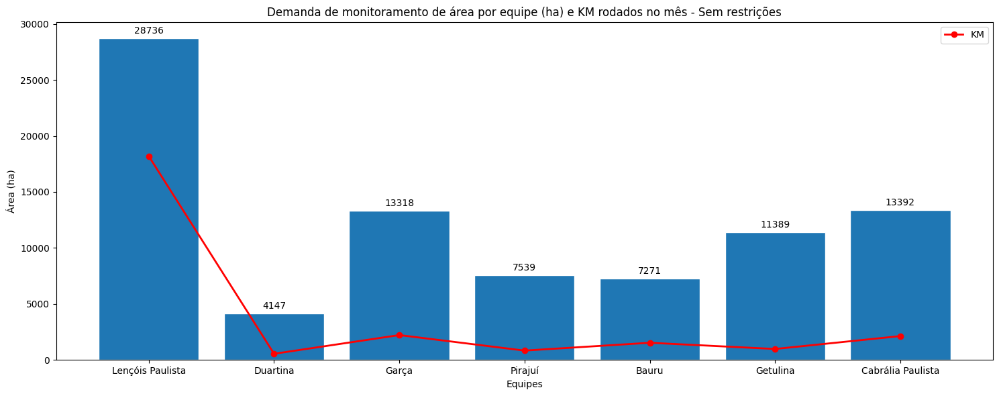

In [30]:
fig_srest, ax = plt.subplots(figsize=(15, 6))  # Largura de 10 polegadas e altura de 6 polegadas

# Dados do gráfico de barras
xbar = distribuicao['Equipe Nome']
ybar = distribuicao['Área Avaliada']

# Dados do gráfico de linhas
xline = distribuicao['Equipe Nome']
yline = distribuicao['Trajeto (Km)']

# Criar o gráfico de barras
bars = ax.bar(xbar, ybar, width=0.8, edgecolor='white')

# Adicionar rótulos às barras
ax.bar_label(bars, fmt='%d', padding=3)

# Criar o gráfico de linhas no mesmo conjunto de eixos
ax.plot(xline, yline, color='red', marker='o', linestyle='-', linewidth=2, label='KM')

ax.legend()

ax.set_xlabel('Equipes')

ax.set_ylabel('Área (ha)')

ax.set_title('Demanda de monitoramento de área por equipe (ha) e KM rodados no mês - Sem restrições') 

fig_srest.tight_layout()

plt.show()

In [31]:
carteira_df

,equipe,mes,demanda,capacidade maxima,distancia maxima,km
A03-24,A,2024-03-01,28736.09,105000.0,100000,18191.442959
B03-24,B,2024-03-01,4147.66,105000.0,100000,547.116360
C03-24,C,2024-03-01,13318.27,105000.0,100000,2218.054349
D03-24,D,2024-03-01,7539.13,105000.0,100000,831.687594
E03-24,E,2024-03-01,7271.31,105000.0,100000,1530.712204
G03-24,G,2024-03-01,11389.57,105000.0,100000,976.497231
H03-24,H,2024-03-01,13392.60,105000.0,100000,2128.196657


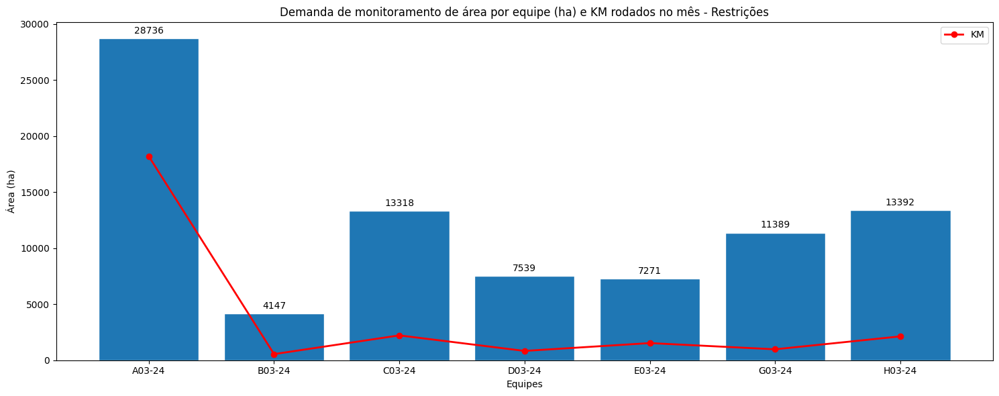

In [32]:
fig, ax = plt.subplots(figsize=(15, 6))  # Largura de 10 polegadas e altura de 6 polegadas

# Dados do gráfico de barras
xbar = carteira_df.index
ybar = carteira_df['demanda']

# Dados do gráfico de linhas
xline = carteira_df.index
yline = carteira_df['km']

# Criar o gráfico de barras
bars = ax.bar(xbar, ybar, width=0.8, edgecolor='white')

# Adicionar rótulos às barras
ax.bar_label(bars, fmt='%d', padding=3)

# Criar o gráfico de linhas no mesmo conjunto de eixos
ax.plot(xline, yline, color='red', marker='o', linestyle='-', linewidth=2, label='KM')

ax.legend()

ax.set_xlabel('Equipes')

ax.set_ylabel('Área (ha)')

ax.set_title('Demanda de monitoramento de área por equipe (ha) e KM rodados no mês - Restrições')

fig.tight_layout()

plt.show()


In [33]:
#Próximos passos

#É necessário atingir todo o monitoramento;

#Realizar formação de blocos e ver a área total do bloco; (Como definir os blocos? O que deve ser feito com os blocos para atingir o monitoramento?)

#Todo o monitoramento deve ser feito dentro de 2 meses;

#Otimizador voltado para custos

#Equalizar e definir se é necessário contratação de novas equipes

In [34]:
#Atribuindo o planejamento as geometrias
projetos = projetos.merge(otimizacao_rotas, left_on = 'ID_PROJETO', right_on ='ID Fazenda', how='left')
#Geodata frame não nos permite utilizar timestamp
projetos['Mês demanda'] = projetos['Mês demanda'].apply(lambda x: x.strftime('%Y-%m-%d') if pd.notnull(x) else None)
projetos['Sugestão de Replanejamento'] = projetos['Sugestão de Replanejamento'].apply(lambda x: x.strftime('%Y-%m-%d') if pd.notnull(x) else None)

projetos = projetos[pd.notna(projetos['Mês demanda'])]

In [35]:
#projetos = projetos[projetos['Mês demanda'] == '2024-03-01']

In [36]:
projetos['Mês demanda'].unique()

array(['2024-03-01', '2024-04-01'], dtype=object)

In [37]:
def preenchimento_grafico(equipe):
    if equipe == 'Sem equipe atribuída':
        return '#FF0000'  # Vermelho forte
    if equipe == 'Getulina':
        return '#3498DB'  # Azul forte
    if equipe == 'Pirajuí':
        return '#2ECC71'  # Verde limão
    if equipe == 'Duartina':
        return '#F1C40F'  # Amarelo ouro
    if equipe == 'Garça':
        return '#E67E22'  # Laranja escuro
    if equipe == 'Lençóis Paulista':
        return '#1F77B4'  # Azul escuro
    if equipe == 'Bauru':
        return '#9B59B6'  # Roxo
    if equipe == 'Cabrália Paulista':
        return '#FF5733'  # Laranja vibrante

In [38]:
otimizacao_rotas

,ID Fazenda,Projeto,Área,Trajeto (Km),Área Avaliada,Mês demanda,Equipe Avaliadora,Sugestão de Replanejamento,Equipe Nome
0,0003,UNIÃO,913.96,18.858908,748.94,2024-03-01,H,None,Cabrália Paulista
1,0006,LIMEIRA,1613.31,28.687512,820.61,2024-03-01,D,None,Pirajuí
2,0010,IPIRANGA,728.14,17.624874,404.91,2024-03-01,A,None,Lençóis Paulista
3,0016,BOA VISTA I,485.95,35.909002,12.36,2024-03-01,A,None,Lençóis Paulista
4,0024,TURVINHO IV,243.70,0.000000,144.01,2024-03-01,D,None,Pirajuí
...,...,...,...,...,...,...,...,...,...
796,2366,REMANSO III,168.91,30.392452,139.22,2024-04-01,E,None,Bauru
797,2396,MARAGY,297.61,37.806085,45.24,2024-04-01,G,None,Getulina
798,2409,PINDORAMA II - GLEBA A,111.46,41.445281,15.34,2024-04-01,E,None,Bauru
799,2410,PINDORAMA II - GLEBA B,855.33,42.189261,29.45,2024-04-01,E,None,Bauru


In [39]:
#Definindo e criando o mapa e onde ele deve iniciar
fmap = folium.Map(location=(-22.541610181727574, -48.80887462157965), zoom_start= 8)

feat_geojson = folium.features.GeoJson(projetos,
                                        name = 'Otimização de planejamento',
                                        tooltip = folium.GeoJsonTooltip(fields=['Equipe Nome','Projeto']),
                                        style_function= lambda feature:{'fillColor':preenchimento_grafico(feature['properties']['Equipe Nome']), 
                                                         'color' :'black',
                                                         'wigth' : 0.5
                                        })

#Ajusta a página para ter todos os itens no mesmo visual
folium.FitOverlays(fly=True, padding=2).add_to(fmap)

#Pesquisar informações no mapa
Geocoder().add_to(fmap)

#Modo tela cheia
Fullscreen(title='Expandir mapa', title_cancel='Sair', force_separate_button= True).add_to(fmap)

#Adicionando cálculo de medida
fmap = fmap.add_child(MeasureControl())


fmap = fmap.add_child(feat_geojson)

In [40]:
#Incluir filtros no mapa para filtrar somente as equipes de interesse
    #Incluir filtro por mês
    #Tenho que respeitar o planejado dentro do mês? Não posso avaliar por bloco? O SOF é combinado por algum gatilho?
    #Programação por bloco
    #Planejamento sem restrição
    #Criar classes de distâncias para diminuir o ruído
    #Base de distância entre fazendas



In [41]:
fmap